# Scentinel neighborhoods in Milopy

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd

import scentinel

import milopy
import milopy.core as milo

Make sure that Python modules winreg, win32api or win32con are installed.
INFO: blas_opt_info:
INFO: blas_armpl_info:
INFO: customize UnixCCompiler
INFO:   libraries armpl_lp64_mp not found in ['/home/jovyan/my-conda-envs/scentinel_env/lib', '/usr/local/lib', '/usr/lib64', '/usr/lib', '/usr/lib/x86_64-linux-gnu']
INFO:   NOT AVAILABLE
INFO: 
INFO: blas_mkl_info:
INFO:   libraries mkl_rt not found in ['/home/jovyan/my-conda-envs/scentinel_env/lib', '/usr/local/lib', '/usr/lib64', '/usr/lib', '/usr/lib/x86_64-linux-gnu']
INFO:   NOT AVAILABLE
INFO: 
INFO: blis_info:
INFO:   libraries blis not found in ['/home/jovyan/my-conda-envs/scentinel_env/lib', '/usr/local/lib', '/usr/lib64', '/usr/lib', '/usr/lib/x86_64-linux-gnu']
INFO:   NOT AVAILABLE
INFO: 
INFO: openblas_info:
INFO:   libraries openblas not found in ['/home/jovyan/my-conda-envs/scentinel_env/lib', '/usr/local/lib', '/usr/lib64', '/usr/lib', '/usr/lib/x86_64-linux-gnu']
INFO:   NOT AVAILABLE
INFO: 
INFO: accelerate_info:
INFO:  

INFO:rpy2.situation:cffi mode is CFFI_MODE.ANY
INFO:rpy2.situation:R home found: /usr/lib/R
INFO:rpy2.situation:R library path: /usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/lib/R/lib:/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/java-8-openjdk-amd64/jre/lib/amd64/server
INFO:rpy2.situation:LD_LIBRARY_PATH: /usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/lib/R/lib:/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/java-8-openjdk-amd64/jre/lib/amd64/server
INFO:rpy2.rinterface_lib.embedded:Default options to initialize R: rpy2, --quiet, --no-save
INFO:rpy2.rinterface_lib.embedded:R is already initialized. No need to initialize.


In [2]:
## r2py setup
import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
anndata2ri.activate()

## packages used within milopy incase need to adapt milopy
from audioop import add
import logging
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.sparse
import anndata
from typing import Union, Optional, Sequence, Any, Mapping, List, Tuple
from anndata import AnnData
from scipy.sparse import csr_matrix
import random
import re

# rpy2 setup to run edgeR functions
from rpy2.robjects.packages import PackageNotInstalledError, importr
import rpy2.robjects.numpy2ri
from rpy2.robjects import pandas2ri
import rpy2.robjects as ro
from rpy2.robjects.conversion import localconverter
from rpy2.robjects.packages import STAP

In [3]:
import matplotlib.pyplot as plt

In [4]:
adata = sc.read("data_directory_input_to_scentinel.h5ad", backed="r")

In [5]:
adata_samp = sc.read("data_directory_output_from_scentinel.h5ad", backed="r")

# milo.make_nhoods

- swap out the random assignment of verticies

In [14]:
def milo_nhood_contruction_from_scentinel(adata, adata_samp):
    refined_vertices = [
        i for i, obs in enumerate(adata.obs.index) if obs in adata_samp.obs.index
    ]

    knn_graph = adata.obsp["connectivities"]

    nhoods = knn_graph[:, refined_vertices]
    adata.obsm["nhoods"] = nhoods
    # Add ixs to adata
    # adata.obs["nhood_ixs_random"] = adata.obs_names.isin(
    #    adata.obs_names[random_vertices])
    adata.obs["nhood_ixs_refined"] = adata.obs_names.isin(
        adata.obs_names[refined_vertices]
    )
    adata.obs["nhood_ixs_refined"] = adata.obs["nhood_ixs_refined"].astype("int")
    # adata.obs["nhood_ixs_random"] = adata.obs["nhood_ixs_random"].astype("int")
    # Store info on neighbor_key used
    # adata.uns["nhood_neighbors_key"] = neighbors_key
    # Store distance to K-th nearest neighbor (used for spatial FDR correction)
    # if neighbors_key is None:
    #    k = adata.uns["neighbors"]["params"]["n_neighbors"]
    #    knn_dists = adata.obsp["distances"]
    # else:
    #    k = adata.uns[neighbors_key]["params"]["n_neighbors"]
    #    knn_dists = adata.obsp[neighbors_key + "_distances"]
    knn_dists = adata.obsp["distances"]

    nhood_ixs = adata.obs["nhood_ixs_refined"] == 1
    dist_mat = knn_dists[nhood_ixs, :]
    k_distances = dist_mat.max(1).toarray().ravel()
    adata.obs["nhood_kth_distance"] = 0
    adata.obs.loc[
        adata.obs["nhood_ixs_refined"] == 1, "nhood_kth_distance"
    ] = k_distances

In [15]:
milo_nhood_contruction_from_scentinel(adata, adata_samp)

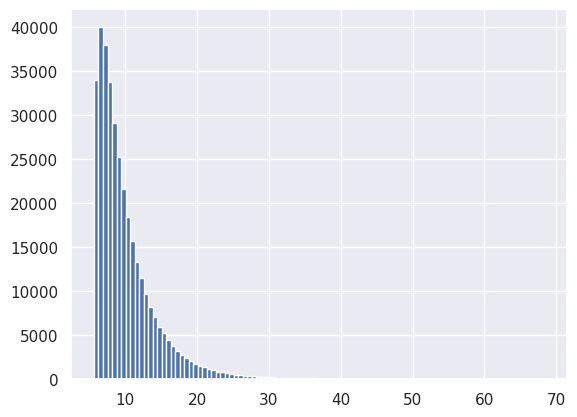

In [16]:
nhood_size = np.array(adata.obsm["nhoods"].sum(0)).ravel()
plt.hist(nhood_size, bins=100);

## Note: may need to add a correction factor here for data where we know it was sorted prior - add in after full top down done

In [17]:
# make a new column so age can be assigned to each sample individually
adata.obs["milo_sample_ID_for_age"] = (
    adata.obs["integration_donor"].astype(str) + "_" + adata.obs["age"].astype(str)
)

In [18]:
milo.count_nhoods(adata, sample_col="milo_sample_ID_for_age")

In [19]:
adata.obs["age"] = adata.obs["age"].astype(float)

# treat each age as individual bins for now 
- note this treats each unique age as an individual timepoint 
- this doesn't repect the distance in time 
- start with each unique e.g. 4.4, 4.6,  4.9 is all equal but if this doesn't work then combine these as 4-4.9 , then 5-5.9

In [20]:
from pprint import pprint

In [21]:
from collections import defaultdict

In [22]:
bins = defaultdict(list)
for age in sorted(adata.obs["age"].unique()):
    bins[f"stg_{str(int(age)).zfill(2) if (int(age)) < 10 else str(int(age))}"].append(
        str(age)
    )

pprint(dict(bins))

{'stg_04': ['4.0'],
 'stg_05': ['5.0', '5.1', '5.2', '5.4', '5.5', '5.8'],
 'stg_06': ['6.0', '6.5', '6.6', '6.7', '6.9'],
 'stg_07': ['7.0', '7.2', '7.5', '7.6'],
 'stg_08': ['8.0', '8.1', '8.4', '8.5', '8.6', '8.8'],
 'stg_09': ['9.0', '9.2', '9.3', '9.5'],
 'stg_10': ['10.0'],
 'stg_11': ['11.0', '11.5', '11.7'],
 'stg_12': ['12.0'],
 'stg_13': ['13.0'],
 'stg_14': ['14.0'],
 'stg_15': ['15.0'],
 'stg_16': ['16.0'],
 'stg_17': ['17.0'],
 'stg_18': ['18.0'],
 'stg_19': ['19.0'],
 'stg_20': ['20.0'],
 'stg_21': ['21.0'],
 'stg_22': ['22.0'],
 'stg_36': ['36.0']}


In [23]:
from itertools import chain

df = pd.DataFrame(
    {
        "bin": np.repeat(list(bins.keys()), [len(v) for k, v in bins.items()]),
        "stg": list(chain.from_iterable(bins.values())),
    }
)
bins = dict(zip(df["stg"], df["bin"]))

adata.obs["stage_bins"] = adata.obs["age"].astype(str).map(bins)
adata.obs["stage_bins"]

collin_AAACGAACATTGAAGA-PCW10          stg_10
collin_AAAGTCCAGAAAGTCT-PCW10          stg_10
collin_AAAGTCCCAATAACCC-PCW10          stg_10
collin_AAAGTGAAGCGCACAA-PCW10          stg_10
collin_AAAGTGACAGTTGCGC-PCW10          stg_10
                                        ...  
suo_FCAImmP7803042-AGTGGGAGTCGACTGC    stg_14
suo_FCAImmP7803042-CCATTCGTCAACACAC    stg_14
suo_FCAImmP7803042-CGTAGCGAGTGACATA    stg_14
suo_FCAImmP7803042-TGGCCAGCAATGAAAC    stg_14
suo_FCAImmP7803042-ATTGGACAGGAGTACC    stg_14
Name: stage_bins, Length: 3480398, dtype: object

In [24]:
adata.obs["stage_bins"].value_counts()

stg_06    758157
stg_08    400422
stg_12    329789
stg_14    282990
stg_09    257494
stg_07    239221
stg_05    193512
stg_15    190195
stg_11    188270
stg_10    173829
stg_16    134933
stg_13    103873
stg_17    100936
stg_18     44730
stg_20     29686
stg_04     12729
stg_22     12212
stg_36     11910
stg_21      9936
stg_19      5574
Name: stage_bins, dtype: int64

In [25]:
adata.obs.groupby(["stage_bins", "age"]).apply(len)


# if convert into numbers GLM will see actual time difference, as string it won't
# string will see 1 vs all
# look at contrast parameter
# ideally for this pass in number - cat.codes

stage_bins  age 
stg_04      4.0      12729
stg_05      5.0      80291
            5.1       4504
            5.2      23526
            5.4      10576
            5.5      59667
            5.8      14948
stg_06      6.0     123966
            6.5      43391
            6.6      86853
            6.7      79956
            6.9     423991
stg_07      7.0     171903
            7.2       7220
            7.5      41310
            7.6      18788
stg_08      8.0     213085
            8.1      31473
            8.4      12669
            8.5     119226
            8.6      12314
            8.8      11655
stg_09      9.0     129504
            9.2      86890
            9.3      12453
            9.5      28647
stg_10      10.0    173829
stg_11      11.0     78364
            11.5    103656
            11.7      6250
stg_12      12.0    329789
stg_13      13.0    103873
stg_14      14.0    282990
stg_15      15.0    190195
stg_16      16.0    134933
stg_17      17.0    100936
stg_18     

In [26]:
# convert stage into an increasing integer to replicate the one hot encoding (not exact one hot) so single column 0-n

# adata.obs['stage_bin_milo_input'] = 0
# for idx, stage in enumerate(sorted(adata.obs['stage_bins'].unique())):
#    adata.obs.loc[adata.obs['stage_bins'] == stage, 'stage_bin_milo_input'] = idx

adata.obs["stage_bin_milo_input"] = (
    adata.obs["stage_bins"].rank(method="dense", ascending=True).astype(int) - 1
)

adata.obs.groupby(["stage_bin_milo_input", "stage_bins"]).apply(len)

stage_bin_milo_input  stage_bins
0                     stg_04         12729
1                     stg_05        193512
2                     stg_06        758157
3                     stg_07        239221
4                     stg_08        400422
5                     stg_09        257494
6                     stg_10        173829
7                     stg_11        188270
8                     stg_12        329789
9                     stg_13        103873
10                    stg_14        282990
11                    stg_15        190195
12                    stg_16        134933
13                    stg_17        100936
14                    stg_18         44730
15                    stg_19          5574
16                    stg_20         29686
17                    stg_21          9936
18                    stg_22         12212
19                    stg_36         11910
dtype: int64

In [27]:
adata.obs["stage_bin_milo_input_cat"] = adata.obs["stage_bin_milo_input"].astype(str)
adata.obs["stage_bin_milo_input_cat"].dtype

dtype('O')

# Update so stage bins are now numeric so GLM will understand distances in time

In [28]:
adata.obs["stage_bin_milo_input_cat"] = adata.obs["stage_bins"].str.replace(
    "stg_", "", regex=True
)
adata.obs["stage_bin_milo_input_cat"] = adata.obs["stage_bin_milo_input_cat"].astype(
    int
)
print(adata.obs["stage_bin_milo_input_cat"].dtype)
adata.obs["stage_bin_milo_input_cat"].value_counts()

int64


6     758157
8     400422
12    329789
14    282990
9     257494
7     239221
5     193512
15    190195
11    188270
10    173829
16    134933
13    103873
17    100936
18     44730
20     29686
4      12729
22     12212
36     11910
21      9936
19      5574
Name: stage_bin_milo_input_cat, dtype: int64

In [29]:
milo.DA_nhoods(
    adata,
    design="~ stage_bin_milo_input_cat",
    model_contrasts=None,
    subset_samples=None,
    add_intercept=True,
)

In [30]:
milo_results = adata.uns["nhood_adata"].obs

In [31]:
milo_results

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,collin_AAACGAACATTGAAGA-PCW10,2.742859,-0.031483,8.245879,7.088689,0.216052,0.324720,0.321883
1,collin_AAGGAATTCGGCAGTC-PCW10,2.966421,-0.028547,8.237512,7.420723,0.227258,0.337253,0.334362
2,collin_ACAACCATCACATTGG-PCW10,3.310776,-0.029680,8.223148,13.621348,0.151632,0.247086,0.244848
3,collin_ACAGCCGGTTAGTCGT-PCW10,3.375170,-0.009845,8.223783,1.393928,0.618024,0.717560,0.715381
4,collin_AGATCCACACTGAGGA-PCW10,3.306067,-0.028280,8.237417,7.324482,0.231067,0.341512,0.338615
...,...,...,...,...,...,...,...,...
348034,suo_FCAImmP7803042-TCCACACGTAGAAAGG,3.470967,0.019340,8.209580,6.212953,0.426876,0.542924,0.539926
348035,suo_FCAImmP7803042-AGATCTGTCGTTTAGG,3.592869,0.016206,8.216198,2.796039,0.583800,0.687780,0.685386
348036,suo_FCAImmP7803042-AACTCTTGTAAACACA,3.990650,0.034407,8.216313,17.396880,0.145798,0.239576,0.237411
348037,suo_FCAImmP7803042-CTAGAGTAGTAGCGGT,3.782295,0.014199,8.211712,3.110419,0.561525,0.668100,0.665624


In [32]:
adata.uns["nhood_adata"].obs

,index_cell,kth_distance,logFC,logCPM,F,PValue,FDR,SpatialFDR
0,collin_AAACGAACATTGAAGA-PCW10,2.742859,-0.031483,8.245879,7.088689,0.216052,0.324720,0.321883
1,collin_AAGGAATTCGGCAGTC-PCW10,2.966421,-0.028547,8.237512,7.420723,0.227258,0.337253,0.334362
2,collin_ACAACCATCACATTGG-PCW10,3.310776,-0.029680,8.223148,13.621348,0.151632,0.247086,0.244848
3,collin_ACAGCCGGTTAGTCGT-PCW10,3.375170,-0.009845,8.223783,1.393928,0.618024,0.717560,0.715381
4,collin_AGATCCACACTGAGGA-PCW10,3.306067,-0.028280,8.237417,7.324482,0.231067,0.341512,0.338615
...,...,...,...,...,...,...,...,...
348034,suo_FCAImmP7803042-TCCACACGTAGAAAGG,3.470967,0.019340,8.209580,6.212953,0.426876,0.542924,0.539926
348035,suo_FCAImmP7803042-AGATCTGTCGTTTAGG,3.592869,0.016206,8.216198,2.796039,0.583800,0.687780,0.685386
348036,suo_FCAImmP7803042-AACTCTTGTAAACACA,3.990650,0.034407,8.216313,17.396880,0.145798,0.239576,0.237411
348037,suo_FCAImmP7803042-CTAGAGTAGTAGCGGT,3.782295,0.014199,8.211712,3.110419,0.561525,0.668100,0.665624


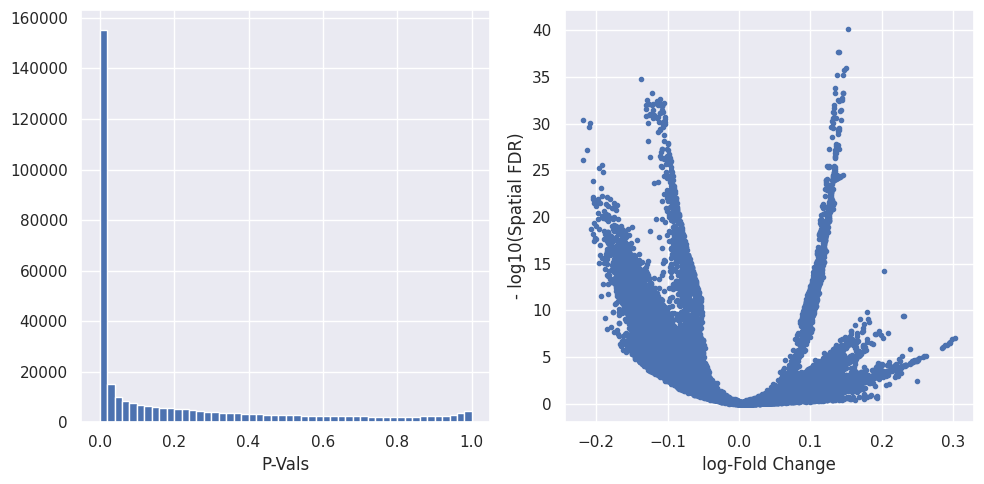

In [33]:
old_figsize = plt.rcParams["figure.figsize"]
plt.rcParams["figure.figsize"] = [10, 5]
plt.subplot(1, 2, 1)
plt.hist(adata.uns["nhood_adata"].obs.PValue, bins=50)
plt.xlabel("P-Vals")
plt.subplot(1, 2, 2)
plt.plot(
    adata.uns["nhood_adata"].obs.logFC,
    -np.log10(adata.uns["nhood_adata"].obs.SpatialFDR),
    ".",
)
plt.xlabel("log-Fold Change")
plt.ylabel("- log10(Spatial FDR)")
plt.tight_layout()
plt.rcParams["figure.figsize"] = old_figsize

# Visualise output

In [34]:
adata

AnnData object with n_obs × n_vars = 3480398 × 17448 backed at '/nfs/team298/ar32/Thesis_lab_hdca/label_testing_on_vae/scENTInEL/integrative_atlas_work/objs_out/adata_run1_IA_V1.h5ad'
    obs: 'study', 'sample_ID', 'library_construction_batch', 'organ', 'age', 'cell_type', 'lane_ID', 'author_batch', 'institute', 'study_PI', 'doi', 'anatomical_region', 'anatomical_region_level_2', 'sex', 'sex_inferred', 'subject_type', 'sample_status', 'sample_cultured', 'protocol_tissue_dissociation', 'cell_enrichment', 'library_platform', 'strand_sequence', 'sequencing_platform', 'reads_processing', 'biological_unit', 'reference_genome', 'reference_genome_ensembl_release', 'handle_anndata', 'LVL3', 'LVL2', 'LVL1', 'LVL0', 'library_platform_coarse', 'dataset_sample_ID', 'integration_donor', 'nhood_ixs_refined', 'nhood_kth_distance', 'milo_sample_ID_for_age', 'stage_bins', 'stage_bin_milo_input', 'stage_bin_milo_input_cat'
    var: 'hgnc'
    uns: 'LVL3_colors', 'neighbors', 'umap', 'nhood_adata'
    ob

### build nhood graph

In [35]:
milopy.utils.build_nhood_graph(adata)

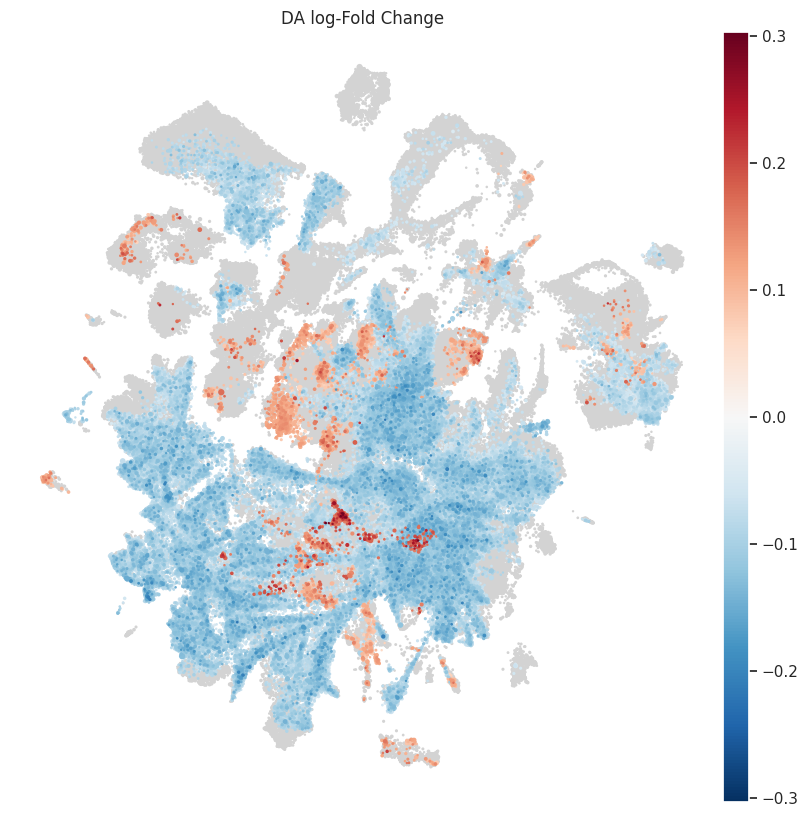

In [36]:
plt.rcParams["figure.figsize"] = [10, 10]
milopy.plot.plot_nhood_graph(
    adata, alpha=0.01, min_size=2  ## SpatialFDR level (1%)  ## Size of smallest dot
)

... storing 'study' as categorical
... storing 'library_construction_batch' as categorical
... storing 'organ' as categorical
... storing 'cell_type' as categorical
... storing 'institute' as categorical
... storing 'study_PI' as categorical
... storing 'doi' as categorical
... storing 'anatomical_region' as categorical
... storing 'anatomical_region_level_2' as categorical
... storing 'sex' as categorical
... storing 'sex_inferred' as categorical
... storing 'subject_type' as categorical
... storing 'sample_status' as categorical
... storing 'sample_cultured' as categorical
... storing 'protocol_tissue_dissociation' as categorical
... storing 'cell_enrichment' as categorical
... storing 'library_platform' as categorical
... storing 'strand_sequence' as categorical
... storing 'sequencing_platform' as categorical
... storing 'reads_processing' as categorical
... storing 'biological_unit' as categorical
... storing 'reference_genome' as categorical
... storing 'reference_genome_ensembl_

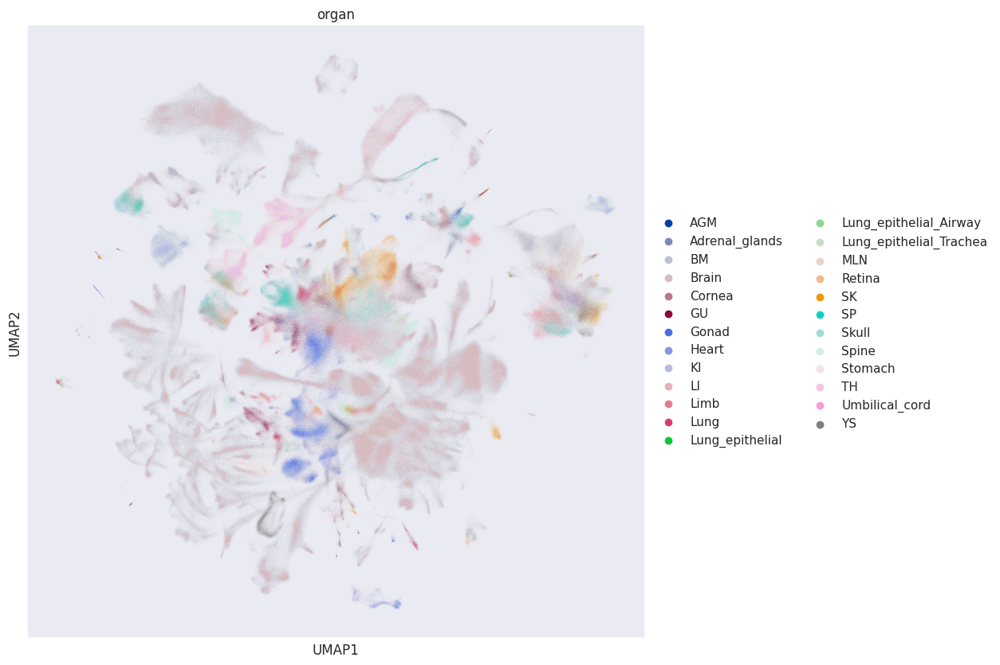

In [37]:
sc.pl.umap(adata, color="organ")

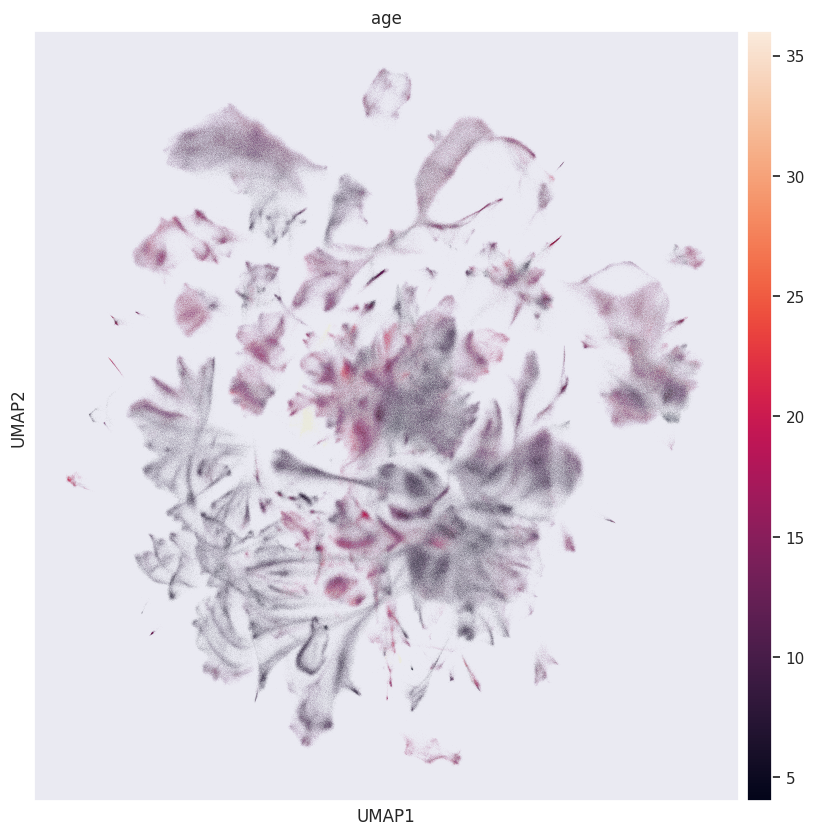

In [40]:
sc.pl.umap(adata, color="age")

In [43]:
milopy.utils.annotate_nhoods(adata, anno_col="LVL3")

Text(0.5, 0, 'celltype fraction')

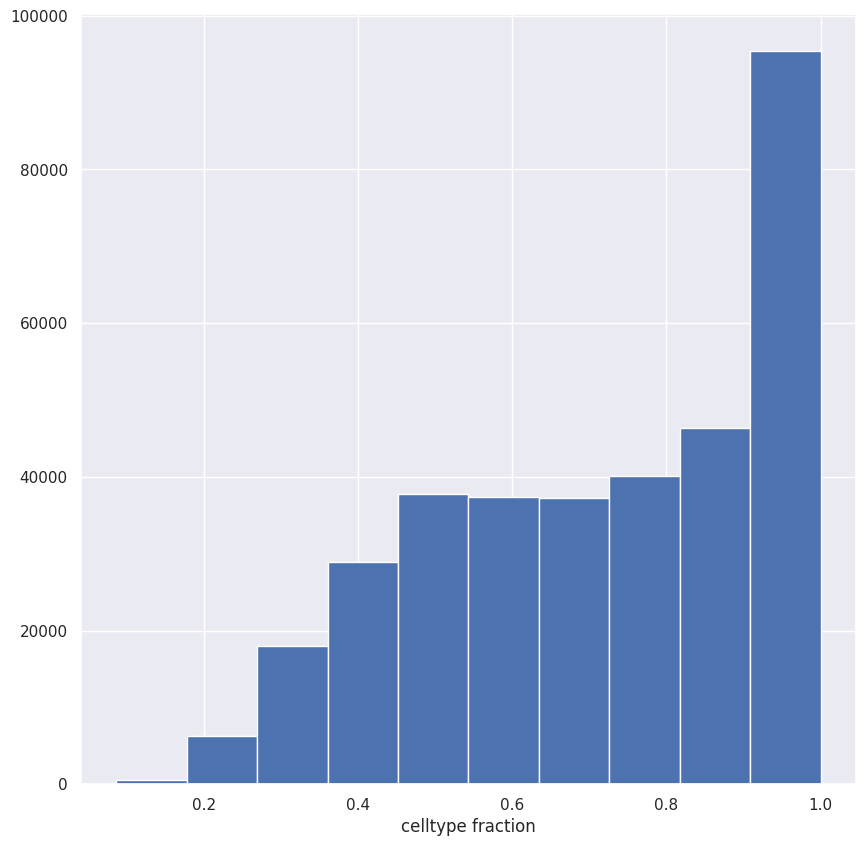

In [44]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [45]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

... storing 'nhood_annotation' as categorical


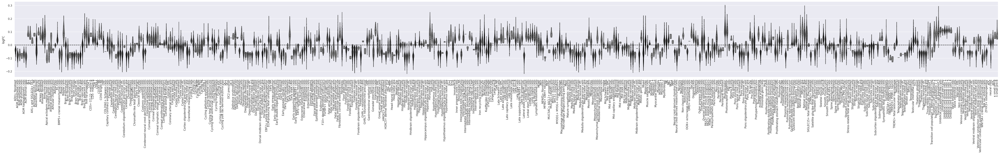

In [46]:
sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [47]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs["LVL3"]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [48]:
%load_ext rpy2.ipython

In [49]:
%%R -i milo_res
head(milo_res)

                     index_cell kth_distance        logFC   logCPM         F
0 collin_AAACGAACATTGAAGA-PCW10     2.742859 -0.031483254 8.245879  7.088689
1 collin_AAGGAATTCGGCAGTC-PCW10     2.966421 -0.028546857 8.237512  7.420723
2 collin_ACAACCATCACATTGG-PCW10     3.310776 -0.029679743 8.223148 13.621348
3 collin_ACAGCCGGTTAGTCGT-PCW10     3.375170 -0.009845341 8.223783  1.393928
4 collin_AGATCCACACTGAGGA-PCW10     3.306067 -0.028279947 8.237417  7.324482
5 collin_AGCGCCAGTAGGACTG-PCW10     3.276125 -0.032597336 8.234377 10.722267
     PValue       FDR SpatialFDR Nhood_size nhood_annotation
0 0.2160524 0.3247201  0.3218828  11.091439      Keratocytes
1 0.2272581 0.3372533  0.3343624   8.871051      Keratocytes
2 0.1516320 0.2470859  0.2448475   7.987611            Mixed
3 0.6180242 0.7175600  0.7153806   6.267122      Keratocytes
4 0.2310667 0.3415118  0.3386150   8.884093     neural crest
5 0.1596593 0.2573161  0.2549826   8.424916     neural crest
  nhood_annotation_frac   nhood_an

In addition: Warning messages:
1: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  library ‘/usr/lib/R/site-library’ contains no packages
2: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  library ‘/usr/lib/R/site-library’ contains no packages
3: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  library ‘/usr/lib/R/site-library’ contains no packages
4: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  library ‘/usr/lib/R/site-library’ contains no packages
5: In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  library ‘/usr/lib/R/site-library’ contains no packages


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     


System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to create bus connection: Host is down


── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In addition: Warning message:
In system("timedatectl", intern = TRUE) :
  running command 'timedatectl' had status 1


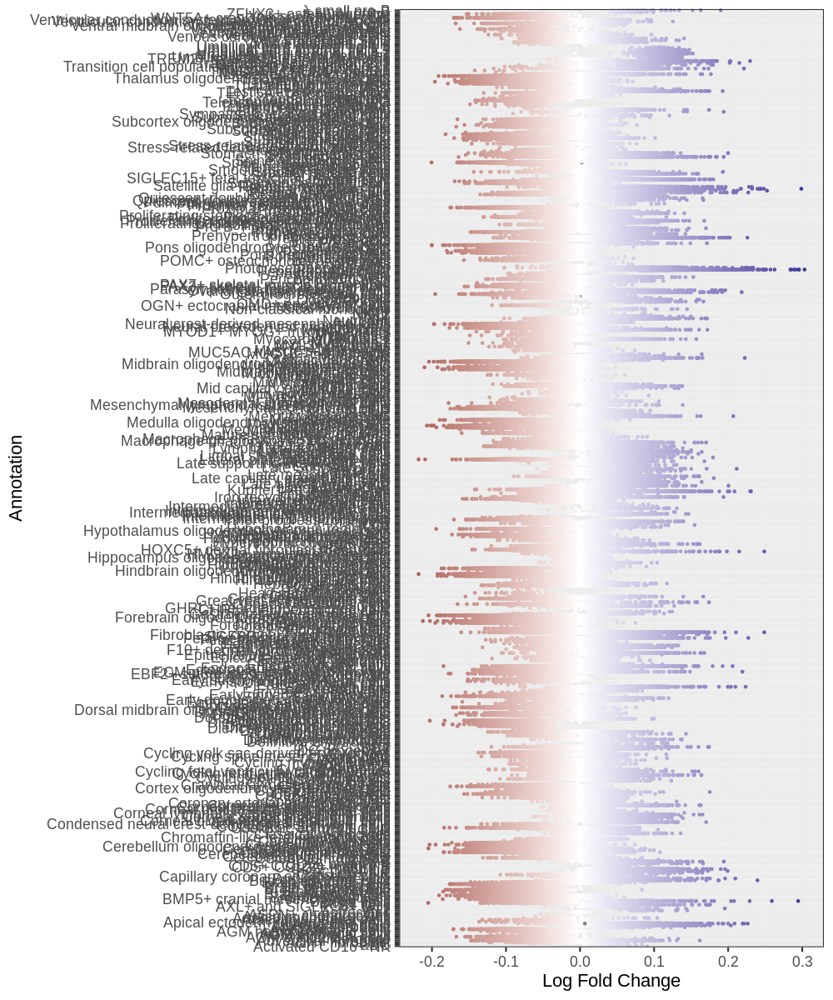

In [50]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

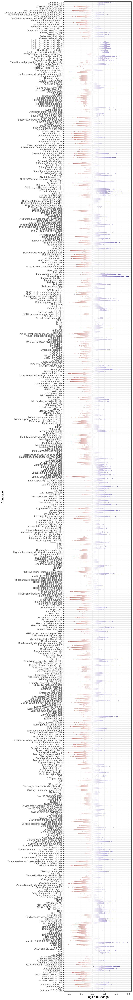

In [51]:
%%R -w 1000 -h 7500  # Adjust the height as needed
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
  mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
  mutate(logFC_color = ifelse(is_signif == 1, logFC, NA)) %>%
  ggplot(aes(nhood_anno, logFC, color = logFC_color)) +
  scale_color_gradient2() +
  guides(color = "none") +
  xlab("Annotation") + ylab("Log Fold Change") +
  geom_quasirandom(alpha = 1) +
  coord_flip() +
  theme_bw(base_size = 22) +
  theme(strip.text.y = element_text(angle = 0))

# above looks to bias based of sampling collection e.g. all of umbilical cord celltypes are enriched late but is this just because it is latest sample

In [52]:
milopy.utils.annotate_nhoods(adata, anno_col="LVL3")

Text(0.5, 0, 'celltype fraction')

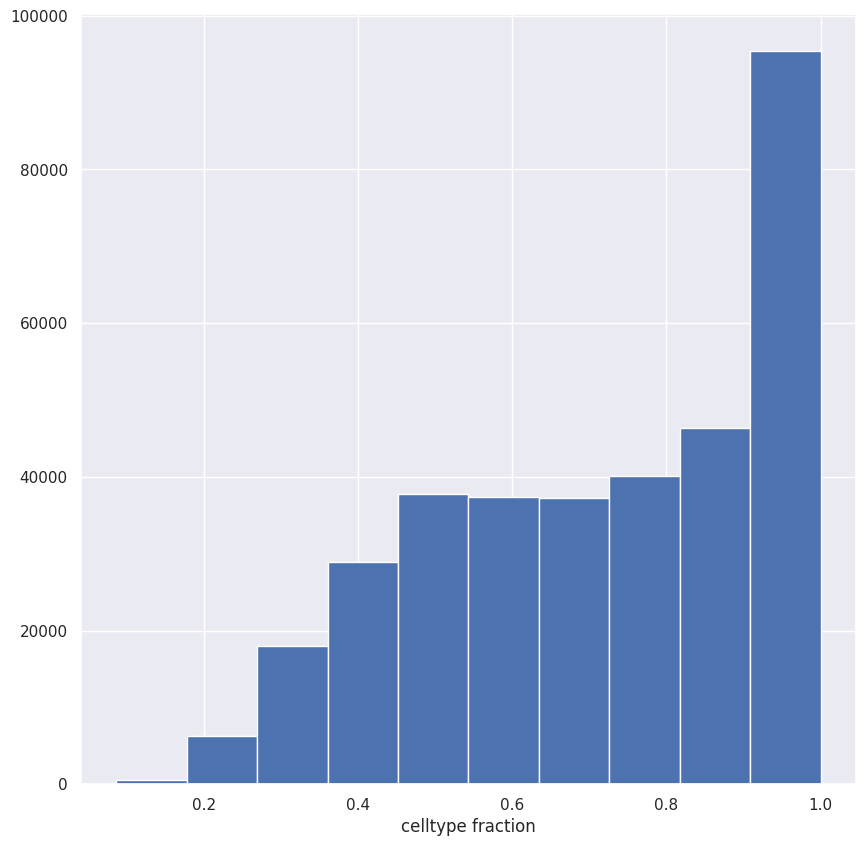

In [53]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [54]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

... storing 'nhood_annotation' as categorical
... storing 'nhood_anno' as categorical


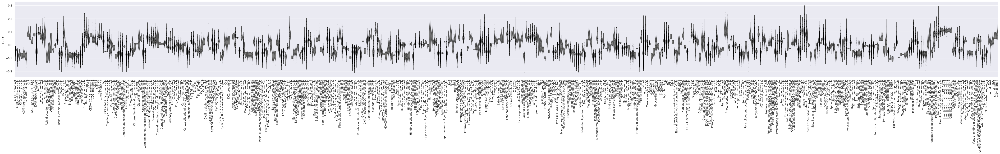

In [55]:
sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [56]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs["LVL3"]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [57]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [58]:
%%R -i milo_res
head(milo_res)

                     index_cell kth_distance        logFC   logCPM         F
0 collin_AAACGAACATTGAAGA-PCW10     2.742859 -0.031483254 8.245879  7.088689
1 collin_AAGGAATTCGGCAGTC-PCW10     2.966421 -0.028546857 8.237512  7.420723
2 collin_ACAACCATCACATTGG-PCW10     3.310776 -0.029679743 8.223148 13.621348
3 collin_ACAGCCGGTTAGTCGT-PCW10     3.375170 -0.009845341 8.223783  1.393928
4 collin_AGATCCACACTGAGGA-PCW10     3.306067 -0.028279947 8.237417  7.324482
5 collin_AGCGCCAGTAGGACTG-PCW10     3.276125 -0.032597336 8.234377 10.722267
     PValue       FDR SpatialFDR Nhood_size nhood_annotation
0 0.2160524 0.3247201  0.3218828  11.091439      Keratocytes
1 0.2272581 0.3372533  0.3343624   8.871051      Keratocytes
2 0.1516320 0.2470859  0.2448475   7.987611            Mixed
3 0.6180242 0.7175600  0.7153806   6.267122      Keratocytes
4 0.2310667 0.3415118  0.3386150   8.884093     neural crest
5 0.1596593 0.2573161  0.2549826   8.424916     neural crest
  nhood_annotation_frac   nhood_an

In [ ]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

In [ ]:
%%R -w 1000 -h 7500  # Adjust the height as needed
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
  mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
  mutate(logFC_color = ifelse(is_signif == 1, logFC, NA)) %>%
  ggplot(aes(nhood_anno, logFC, color = logFC_color)) +
  scale_color_gradient2() +
  guides(color = "none") +
  xlab("Annotation") + ylab("Log Fold Change") +
  geom_quasirandom(alpha = 1) +
  coord_flip() +
  theme_bw(base_size = 22) +
  theme(strip.text.y = element_text(angle = 0))

In [ ]:
adata

In [ ]:
adata.obs["LVL2"].value_counts()

In [ ]:
adata.obs["organ"].value_counts()

# 

# LVL2

In [ ]:
col_use = "LVL2"

milopy.utils.annotate_nhoods(adata, anno_col=col_use)

In [ ]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [ ]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

In [ ]:
del adata.uns["nhood_adata"].uns["nhood_annotation_colors"]

sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [ ]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs[col_use]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [ ]:
%load_ext rpy2.ipython

In [ ]:
%%R -i milo_res
head(milo_res)

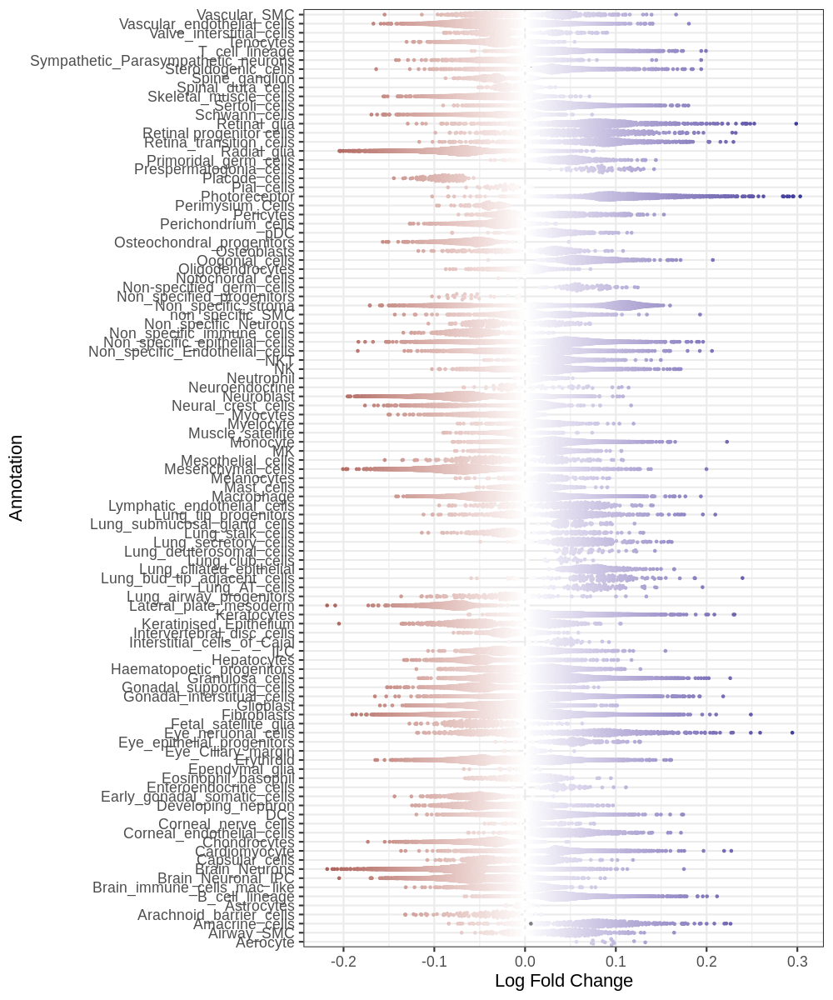

In [71]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

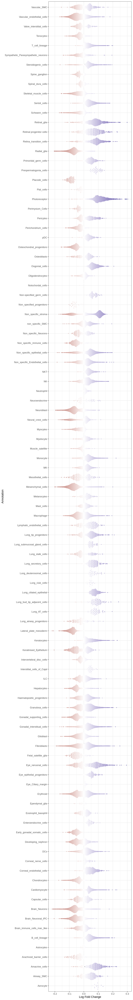

In [72]:
%%R -w 1000 -h 7500  # Adjust the height as needed
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
  mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
  mutate(logFC_color = ifelse(is_signif == 1, logFC, NA)) %>%
  ggplot(aes(nhood_anno, logFC, color = logFC_color)) +
  scale_color_gradient2() +
  guides(color = "none") +
  xlab("Annotation") + ylab("Log Fold Change") +
  geom_quasirandom(alpha = 1) +
  coord_flip() +
  theme_bw(base_size = 22) +
  theme(strip.text.y = element_text(angle = 0))

# LVL1

In [73]:
col_use = "LVL1"

milopy.utils.annotate_nhoods(adata, anno_col=col_use)

Text(0.5, 0, 'celltype fraction')

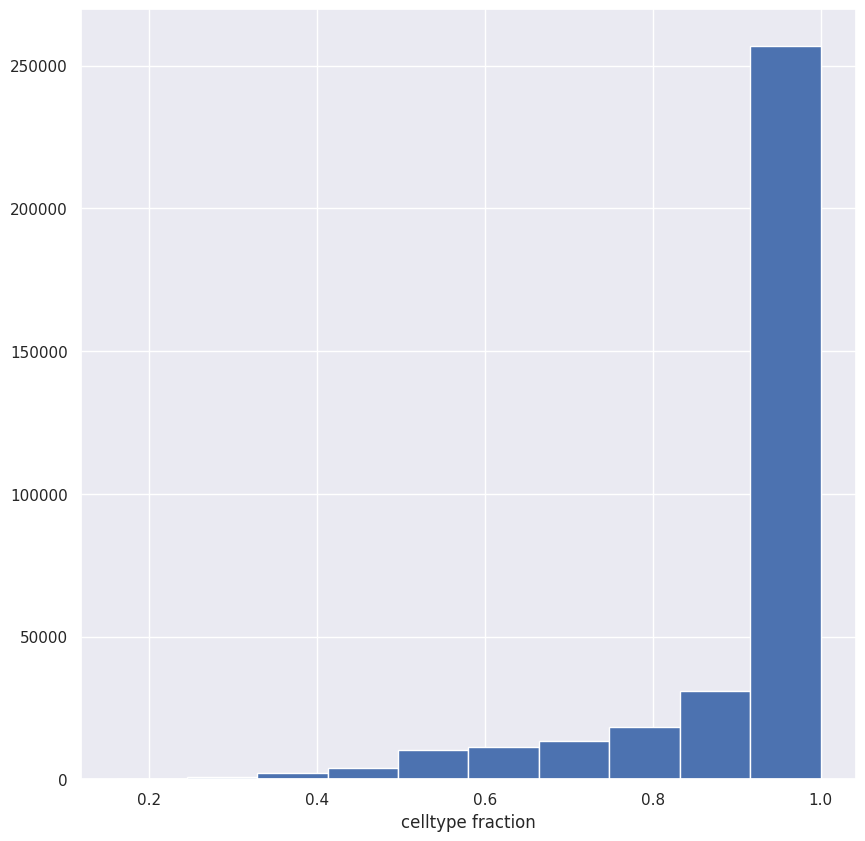

In [74]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [75]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

... storing 'nhood_annotation' as categorical
... storing 'nhood_anno' as categorical


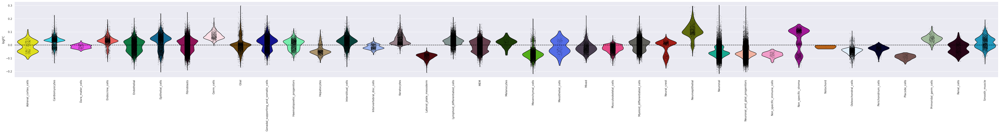

In [76]:
del adata.uns["nhood_adata"].uns["nhood_annotation_colors"]

sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [77]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs[col_use]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [78]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [79]:
%%R -i milo_res
head(milo_res)

                     index_cell kth_distance        logFC   logCPM         F
0 collin_AAACGAACATTGAAGA-PCW10     2.742859 -0.031483254 8.245879  7.088689
1 collin_AAGGAATTCGGCAGTC-PCW10     2.966421 -0.028546857 8.237512  7.420723
2 collin_ACAACCATCACATTGG-PCW10     3.310776 -0.029679743 8.223148 13.621348
3 collin_ACAGCCGGTTAGTCGT-PCW10     3.375170 -0.009845341 8.223783  1.393928
4 collin_AGATCCACACTGAGGA-PCW10     3.306067 -0.028279947 8.237417  7.324482
5 collin_AGCGCCAGTAGGACTG-PCW10     3.276125 -0.032597336 8.234377 10.722267
     PValue       FDR SpatialFDR Nhood_size nhood_annotation
0 0.2160524 0.3247201  0.3218828  11.091439      Keratocytes
1 0.2272581 0.3372533  0.3343624   8.871051      Keratocytes
2 0.1516320 0.2470859  0.2448475   7.987611      Fibroblasts
3 0.6180242 0.7175600  0.7153806   6.267122      Keratocytes
4 0.2310667 0.3415118  0.3386150   8.884093     Neural_crest
5 0.1596593 0.2573161  0.2549826   8.424916     Neural_crest
  nhood_annotation_frac   nhood_an

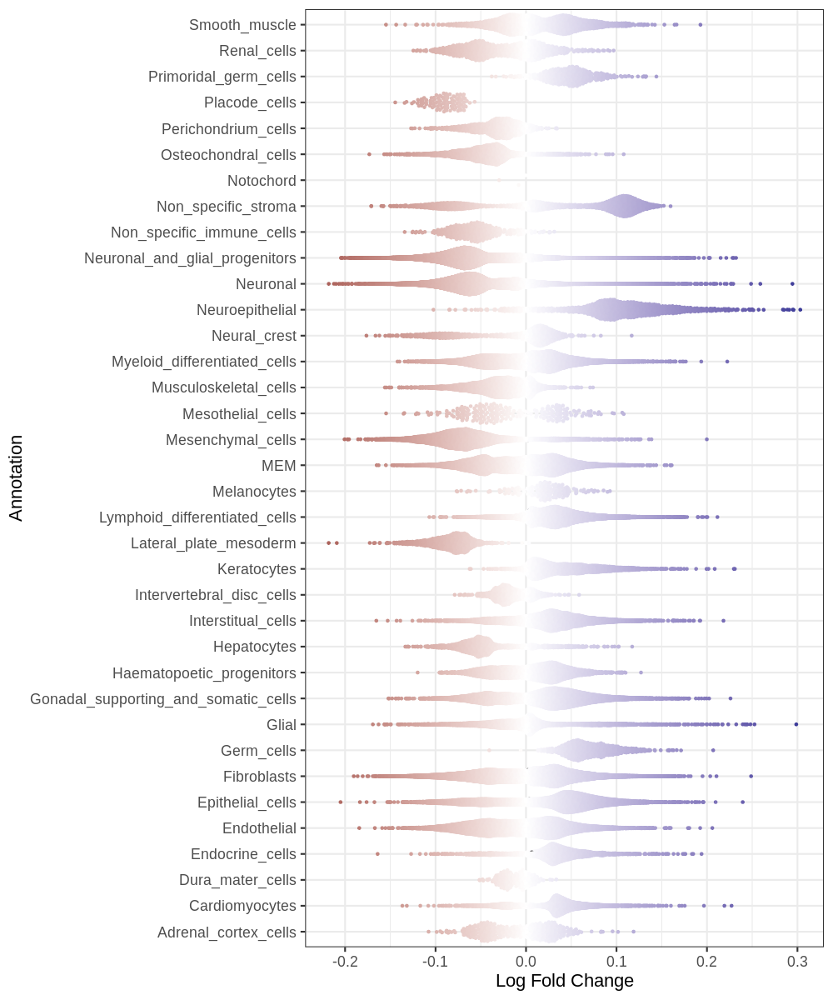

In [80]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

# LVL0

In [81]:
col_use = "LVL0"

milopy.utils.annotate_nhoods(adata, anno_col=col_use)

Text(0.5, 0, 'celltype fraction')

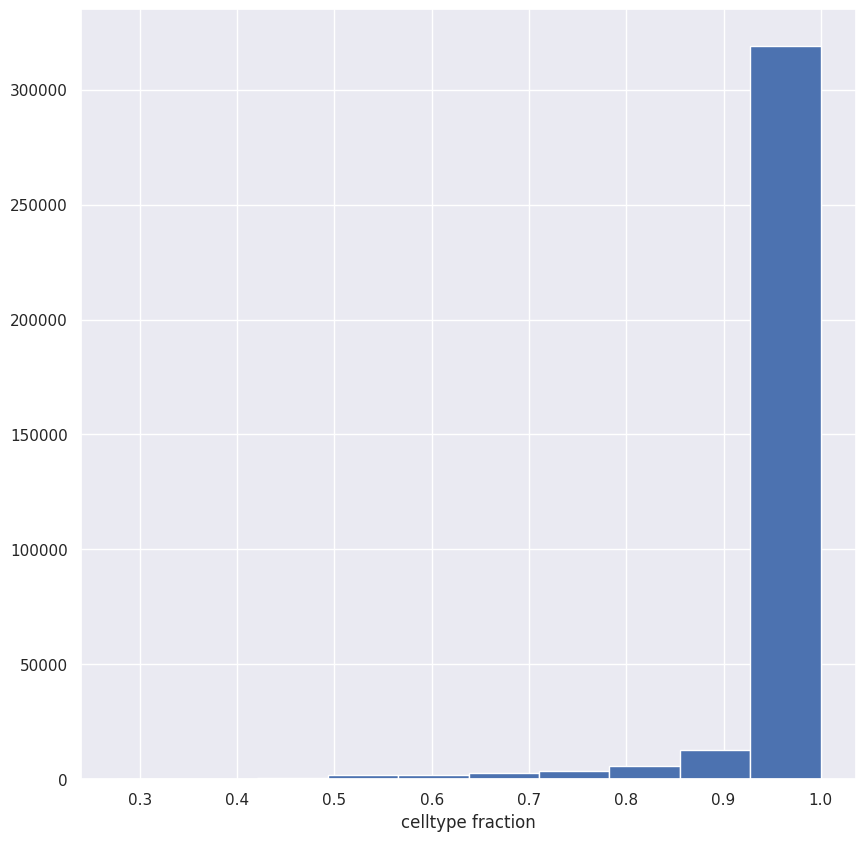

In [82]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [83]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

... storing 'nhood_annotation' as categorical
... storing 'nhood_anno' as categorical


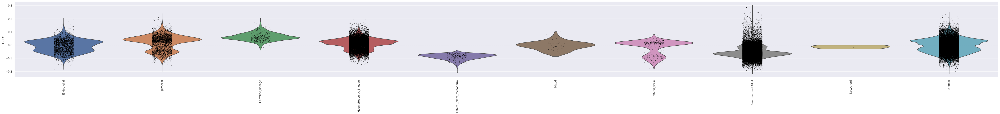

In [84]:
del adata.uns["nhood_adata"].uns["nhood_annotation_colors"]

sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [85]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs[col_use]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [86]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [87]:
%%R -i milo_res
head(milo_res)

                     index_cell kth_distance        logFC   logCPM         F
0 collin_AAACGAACATTGAAGA-PCW10     2.742859 -0.031483254 8.245879  7.088689
1 collin_AAGGAATTCGGCAGTC-PCW10     2.966421 -0.028546857 8.237512  7.420723
2 collin_ACAACCATCACATTGG-PCW10     3.310776 -0.029679743 8.223148 13.621348
3 collin_ACAGCCGGTTAGTCGT-PCW10     3.375170 -0.009845341 8.223783  1.393928
4 collin_AGATCCACACTGAGGA-PCW10     3.306067 -0.028279947 8.237417  7.324482
5 collin_AGCGCCAGTAGGACTG-PCW10     3.276125 -0.032597336 8.234377 10.722267
     PValue       FDR SpatialFDR Nhood_size nhood_annotation
0 0.2160524 0.3247201  0.3218828  11.091439          Stromal
1 0.2272581 0.3372533  0.3343624   8.871051          Stromal
2 0.1516320 0.2470859  0.2448475   7.987611          Stromal
3 0.6180242 0.7175600  0.7153806   6.267122          Stromal
4 0.2310667 0.3415118  0.3386150   8.884093     Neural_crest
5 0.1596593 0.2573161  0.2549826   8.424916     Neural_crest
  nhood_annotation_frac   nhood_an

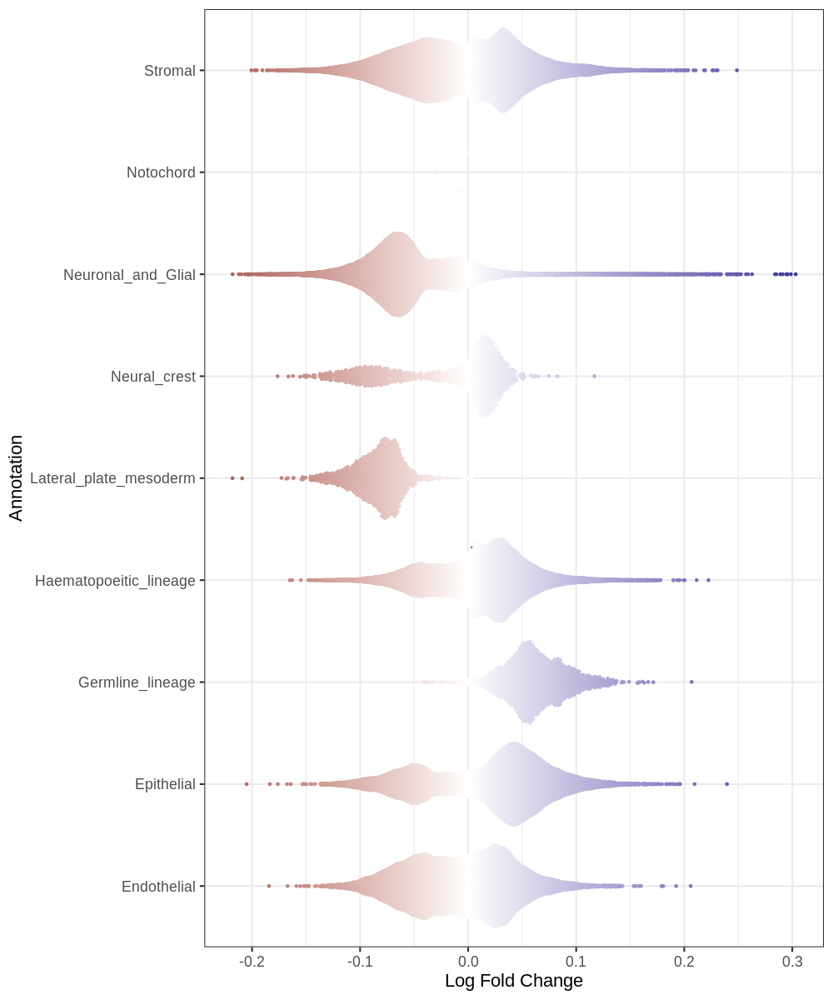

In [88]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

# organ

In [89]:
col_use = "organ"

milopy.utils.annotate_nhoods(adata, anno_col=col_use)

Text(0.5, 0, 'celltype fraction')

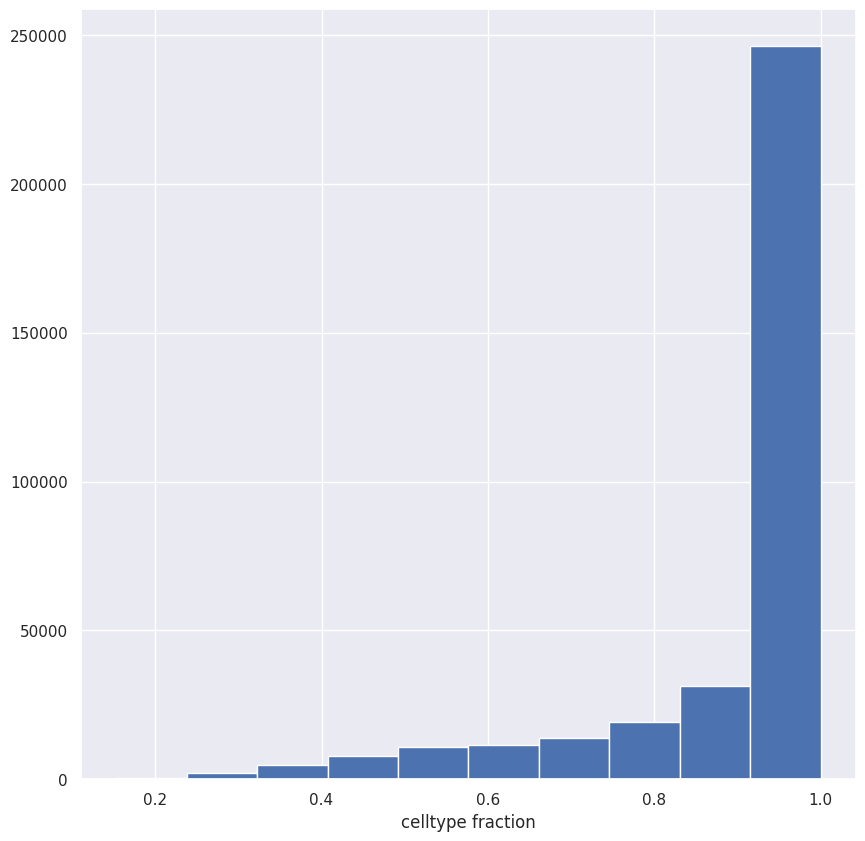

In [90]:
plt.hist(adata.uns["nhood_adata"].obs["nhood_annotation_frac"])
plt.xlabel("celltype fraction")

In [91]:
adata.uns["nhood_adata"].obs.loc[
    adata.uns["nhood_adata"].obs["nhood_annotation_frac"] < 0.4, "nhood_annotation"
] = "Mixed"

... storing 'nhood_annotation' as categorical
... storing 'nhood_anno' as categorical


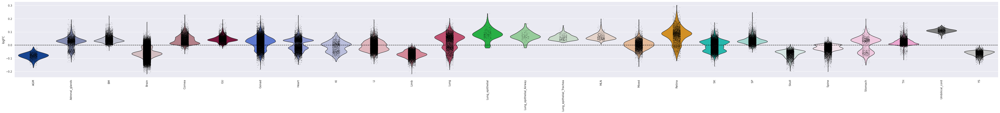

In [92]:
del adata.uns["nhood_adata"].uns["nhood_annotation_colors"]

sc.pl.violin(
    adata.uns["nhood_adata"],
    "logFC",
    groupby="nhood_annotation",
    rotation=90,
    show=False,
)

# Adjust the width of the figure
plt.gcf().set_size_inches(
    80, 6
)  # Set the width and height in inches as per your preference
plt.axhline(y=0, color="black", linestyle="--")
plt.show()

In [93]:
milo_res = adata.uns["nhood_adata"].obs
mapper = dict(zip(adata.obs.index, adata.obs[col_use]))
milo_res["nhood_anno"] = milo_res["index_cell"].map(mapper)
# milo_res_dict[org] = milo_res
milo_res["organ"] = adata.obs["organ"]

In [94]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [95]:
%%R -i milo_res
head(milo_res)

                     index_cell kth_distance        logFC   logCPM         F
0 collin_AAACGAACATTGAAGA-PCW10     2.742859 -0.031483254 8.245879  7.088689
1 collin_AAGGAATTCGGCAGTC-PCW10     2.966421 -0.028546857 8.237512  7.420723
2 collin_ACAACCATCACATTGG-PCW10     3.310776 -0.029679743 8.223148 13.621348
3 collin_ACAGCCGGTTAGTCGT-PCW10     3.375170 -0.009845341 8.223783  1.393928
4 collin_AGATCCACACTGAGGA-PCW10     3.306067 -0.028279947 8.237417  7.324482
5 collin_AGCGCCAGTAGGACTG-PCW10     3.276125 -0.032597336 8.234377 10.722267
     PValue       FDR SpatialFDR Nhood_size nhood_annotation
0 0.2160524 0.3247201  0.3218828  11.091439           Cornea
1 0.2272581 0.3372533  0.3343624   8.871051           Cornea
2 0.1516320 0.2470859  0.2448475   7.987611           Cornea
3 0.6180242 0.7175600  0.7153806   6.267122           Cornea
4 0.2310667 0.3415118  0.3386150   8.884093           Cornea
5 0.1596593 0.2573161  0.2549826   8.424916           Cornea
  nhood_annotation_frac nhood_anno

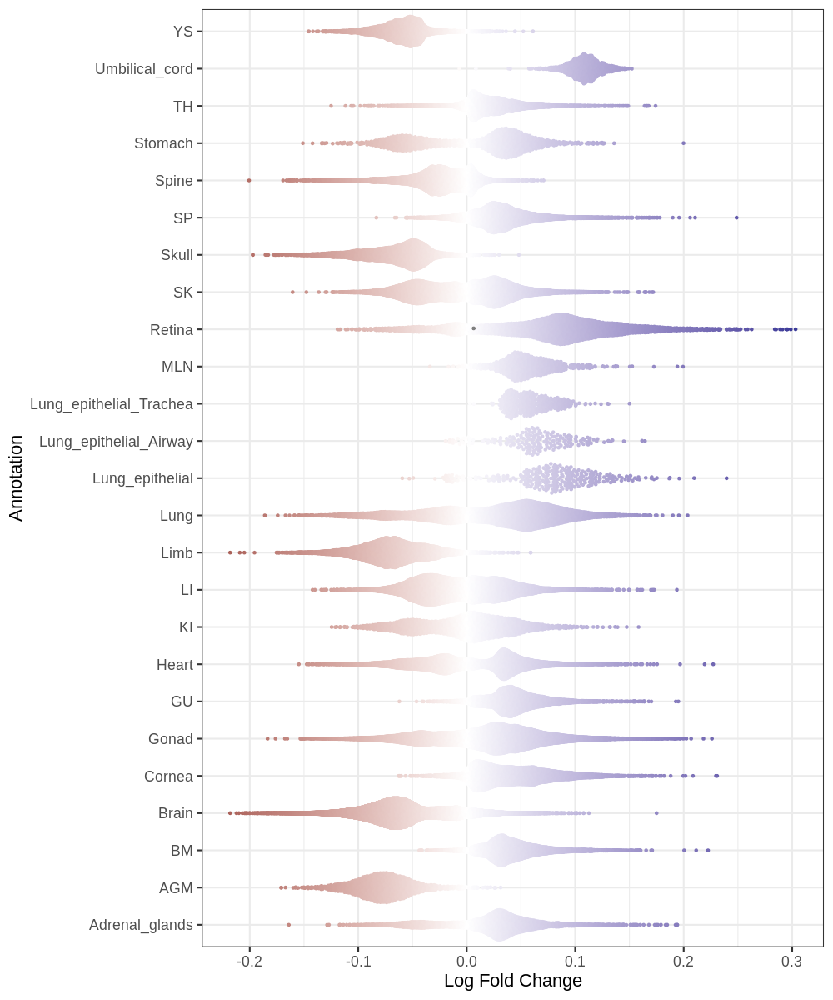

In [96]:
%%R -w 1000 -h 1200
library(tidyverse)
library(ggbeeswarm)

milo_res %>% 
 mutate(is_signif = ifelse(SpatialFDR < 1, 1, 0)) %>%
    mutate(logFC_color = ifelse(is_signif==1, logFC, NA)) %>%
    ggplot(aes(nhood_anno, logFC, color=logFC_color)) +
    scale_color_gradient2() +
    guides(color="none") +
    xlab("Annotation") + ylab("Log Fold Change") +
    geom_quasirandom(alpha=1) +
    coord_flip() +
    theme_bw(base_size=22) +
    theme(strip.text.y =  element_text(angle=0))

# Also compare for subsets with directly overlapping times between organs and running within each organ individually